#Download explainer file

In [ ]:
!gdown 14gaGq0kb54lxsZvsdqJr2ShctJLkK0b7

Downloading...
From: https://drive.google.com/uc?id=14gaGq0kb54lxsZvsdqJr2ShctJLkK0b7
To: /content/explainer_birds_coloring.md
100% 2.07k/2.07k [00:00<00:00, 8.38MB/s]


#Import Libraries

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
import random
import cv2
import os
from tqdm import tqdm

# Data set download and process

## Import data set

In [ ]:
!kaggle datasets download -d davemahony/20-uk-garden-birds

!unzip 20-uk-garden-birds.zip -d birds_dataset


Streaming output truncated to the last 5000 lines.
  inflating: birds_dataset/withBackground/Coal_Tit/(60).jpg  
  inflating: birds_dataset/withBackground/Coal_Tit/(61).jpg  
  inflating: birds_dataset/withBackground/Coal_Tit/(62).jpg  
  inflating: birds_dataset/withBackground/Coal_Tit/(63).jpg  
  inflating: birds_dataset/withBackground/Coal_Tit/(64).jpg  
  inflating: birds_dataset/withBackground/Coal_Tit/(65).jpg  
  inflating: birds_dataset/withBackground/Coal_Tit/(66).jpg  
  inflating: birds_dataset/withBackground/Coal_Tit/(67).jpg  
  inflating: birds_dataset/withBackground/Coal_Tit/(68).jpg  
  inflating: birds_dataset/withBackground/Coal_Tit/(69).jpg  
  inflating: birds_dataset/withBackground/Coal_Tit/(7).jpg  
  inflating: birds_dataset/withBackground/Coal_Tit/(70).jpg  
  inflating: birds_dataset/withBackground/Coal_Tit/(71).jpg  
  inflating: birds_dataset/withBackground/Coal_Tit/(72).jpg  
  inflating: birds_dataset/withBackground/Coal_Tit/(73).jpg  
  inflating: birds_d

## Split DataSet to gray scale and colored images

In [ ]:
input_folder = "birds_dataset/withBackground"

gray_scale_images = []
color_images = []

for bird_class in tqdm(os.listdir(input_folder)):
    class_path = os.path.join(input_folder, bird_class)

    if os.path.isdir(class_path):
        for img_file in os.listdir(class_path):
            img_path = os.path.join(class_path, img_file)
            img = cv2.imread(img_path)

            if img is not None:
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

                img_resized = cv2.resize(img, (128, 128))
                gray_resized = cv2.resize(gray, (128, 128))

                gray_resized = np.expand_dims(gray_resized, axis=-1)

                img_resized = (img_resized / 255)
                gray_resized = (gray_resized / 255)


                color_images.append(img_resized)
                gray_scale_images.append(gray_resized)

gray_scale_images = np.array(gray_scale_images)
color_images = np.array(color_images)

print(f"Dataset Loaded: {gray_scale_images.shape} grayscale images, {color_images.shape} color images.")


100%|██████████| 20/20 [00:23<00:00,  1.17s/it]


Dataset Loaded: (2841, 128, 128, 1) grayscale images, (2841, 128, 128, 3) color images.


## Print sample of data set

Checks if the data is imported properly

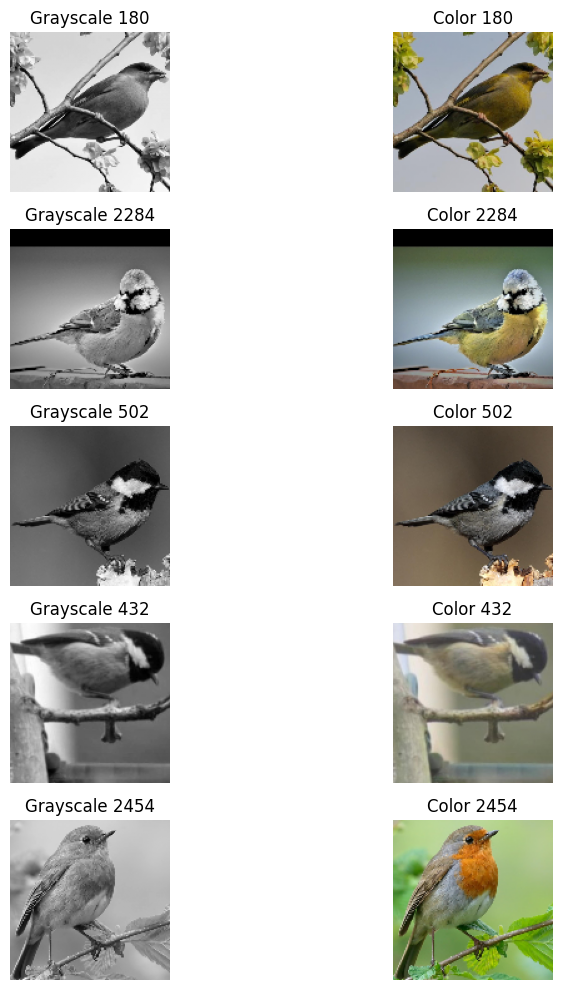

In [ ]:
random_indices = random.sample(range(1, 2801), 5)

target_size = (128, 128)

plt.figure(figsize=(10, 10))

for i, index in enumerate(random_indices):
    gray_resized = cv2.resize(gray_scale_images[index], target_size, interpolation=cv2.INTER_AREA)

    color_resized = cv2.resize(color_images[index], target_size, interpolation=cv2.INTER_AREA)

    plt.subplot(5, 2, 2 * i + 1)
    plt.imshow(gray_resized, cmap="gray")
    plt.title(f"Grayscale {index}")
    plt.axis("off")

    plt.subplot(5, 2, 2 * i + 2)
    plt.imshow(color_resized)
    plt.title(f"Color {index}")
    plt.axis("off")

plt.tight_layout()
plt.show()


##Split into training, testing and validation

In [ ]:
X_train, X_val, y_train, y_val = train_test_split(gray_scale_images, color_images, test_size=0.2, random_state=42)

print(f"Training set: {X_train.shape}, {y_train.shape}")
print(f"Validation set: {X_val.shape}, {y_val.shape}")


Training set: (2272, 128, 128, 1), (2272, 128, 128, 3)
Validation set: (569, 128, 128, 1), (569, 128, 128, 3)


# Training models

## Global functions to track model results during training

In [ ]:
class ImageCallback(tf.keras.callbacks.Callback):
    def __init__(self, val_data, interval=5):
        self.val_data = val_data
        self.interval = interval

    def on_epoch_end(self, epoch, logs=None):
        if (epoch + 1) % self.interval == 0:
            self.display_images(epoch)

    def display_images(self, epoch):
        gray_images, true_colored = self.val_data
        idx = np.random.randint(0, len(gray_images))

        gray_sample = gray_images[idx:idx+1]
        true_sample = true_colored[idx]
        pred_sample = self.model.predict(gray_sample)[0]

        pred_sample = (pred_sample * 255).astype(np.uint8)
        true_sample = (true_sample * 255).astype(np.uint8)


        fig, ax = plt.subplots(1, 3, figsize=(12, 4))

        ax[0].imshow(gray_sample[0, :, :, 0], cmap='gray')
        ax[0].set_title("Grayscale Input")
        ax[0].axis("off")

        ax[1].imshow(pred_sample)
        ax[1].set_title("Model Output")
        ax[1].axis("off")

        ax[2].imshow(true_sample)
        ax[2].set_title("Ground Truth")
        ax[2].axis("off")

        plt.suptitle(f"Epoch {epoch+1}")
        plt.show()

## Loss functions

In [ ]:
def ssim_loss(y_true, y_pred):
    return 1 - tf.reduce_mean(tf.image.ssim(y_true, y_pred, max_val=1.0))

def combined_loss(y_true, y_pred):
    return 0.8 * tf.keras.losses.MeanSquaredError()(y_true, y_pred) + 0.2 * ssim_loss(y_true, y_pred)

## Models

### VGG

#### Architecture of model

In [ ]:
def build_vgg_style_model():
    model = models.Sequential()

    model.add(layers.Conv2D(64, (3, 3), activation='relu', padding='same', input_shape=(128, 128, 1)))
    model.add(layers.Conv2D(64, (3, 3), activation='relu', padding='same'))
    model.add(layers.MaxPooling2D((2, 2), padding='same'))

    model.add(layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(layers.Conv2D(128, (3, 3), activation='relu', padding='same'))
    model.add(layers.MaxPooling2D((2, 2), padding='same'))

    model.add(layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(layers.Conv2D(256, (3, 3), activation='relu', padding='same'))
    model.add(layers.MaxPooling2D((2, 2), padding='same'))

    model.add(layers.Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(layers.Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(layers.MaxPooling2D((2, 2), padding='same'))

    model.add(layers.Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(layers.Conv2D(512, (3, 3), activation='relu', padding='same'))
    model.add(layers.MaxPooling2D((2, 2), padding='same'))

    model.add(layers.Flatten())
    model.add(layers.Dense(4096, activation='relu'))
    model.add(layers.Dense(4096, activation='relu'))

    model.add(layers.Dense(3 * 128 * 128, activation='sigmoid'))
    model.add(layers.Reshape((128, 128, 3)))
    model.compile(optimizer='adam', loss=combined_loss, metrics=['mse'])

    return model

vgg_model = build_vgg_style_model()
vgg_model.summary()



/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 128, 128, 64)        │             640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 128, 128, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 64, 64, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 64, 64, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 64, 64, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 32, 32, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 32, 32, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 16, 16, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_6 (Conv2D)                    │ (None, 16, 16, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_7 (Conv2D)                    │ (None, 16, 16, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 8, 8, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_8 (Conv2D)                    │ (None, 8, 8, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_9 (Conv2D)                    │ (None, 8, 8, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 4, 4, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 8192)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 4096)                │      33,558,528 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 4096)                │      16,781,312 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 49152)               │     201,375,744 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape (Reshape)                    │ (None, 128, 128, 3)         │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 261,119,424 (996.09 MB)

 Trainable params: 261,119,424 (996.09 MB)

 Non-trainable params: 0 (0.00 B)

#### Train the model

Epoch 1/50
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 131ms/step - loss: 0.1863 - mse: 0.0623 - val_loss: 0.1841 - val_mse: 0.0595
Epoch 2/50
71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.1831 - mse: 0.0575 - val_loss: 0.1787 - val_mse: 0.0525
Epoch 3/50
71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.1751 - mse: 0.0496 - val_loss: 0.1736 - val_mse: 0.0470
Epoch 4/50
71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.1725 - mse: 0.0456 - val_loss: 0.1716 - val_mse: 0.0461
Epoch 5/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


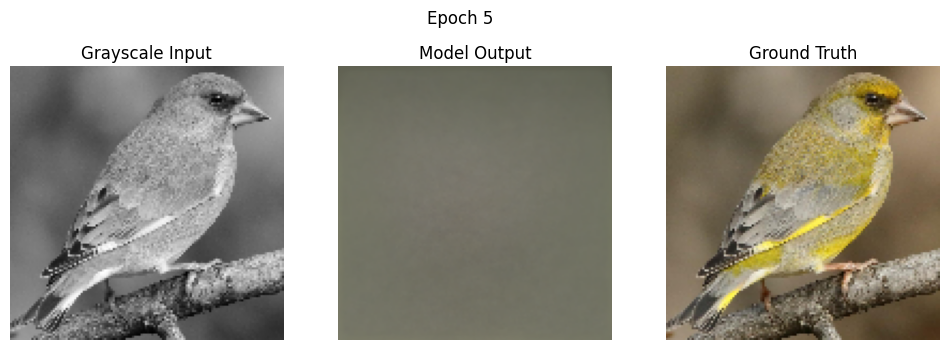

71/71 ━━━━━━━━━━━━━━━━━━━━ 6s 85ms/step - loss: 0.1701 - mse: 0.0443 - val_loss: 0.1696 - val_mse: 0.0440
Epoch 6/50
71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.1679 - mse: 0.0419 - val_loss: 0.1670 - val_mse: 0.0407
Epoch 7/50
71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.1652 - mse: 0.0388 - val_loss: 0.1651 - val_mse: 0.0397
Epoch 8/50
71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.1648 - mse: 0.0372 - val_loss: 0.1637 - val_mse: 0.0374
Epoch 9/50
71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.1616 - mse: 0.0355 - val_loss: 0.1634 - val_mse: 0.0370
Epoch 10/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


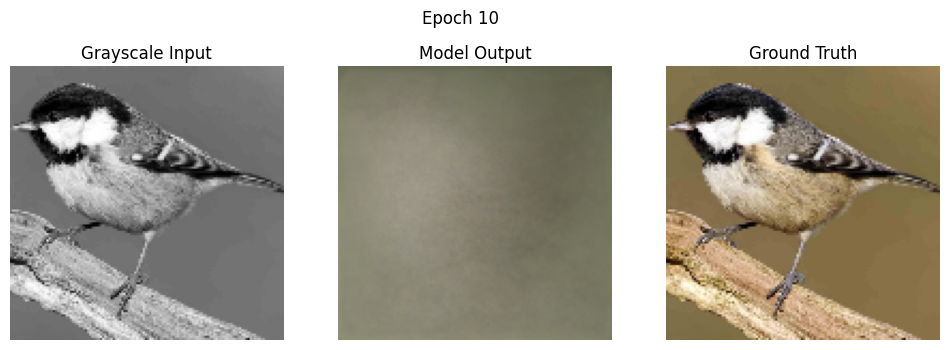

71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1607 - mse: 0.0345 - val_loss: 0.1623 - val_mse: 0.0365
Epoch 11/50
71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.1602 - mse: 0.0346 - val_loss: 0.1615 - val_mse: 0.0358
Epoch 12/50
71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.1567 - mse: 0.0335 - val_loss: 0.1607 - val_mse: 0.0348
Epoch 13/50
71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.1556 - mse: 0.0325 - val_loss: 0.1602 - val_mse: 0.0343
Epoch 14/50
71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.1536 - mse: 0.0314 - val_loss: 0.1594 - val_mse: 0.0337
Epoch 15/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


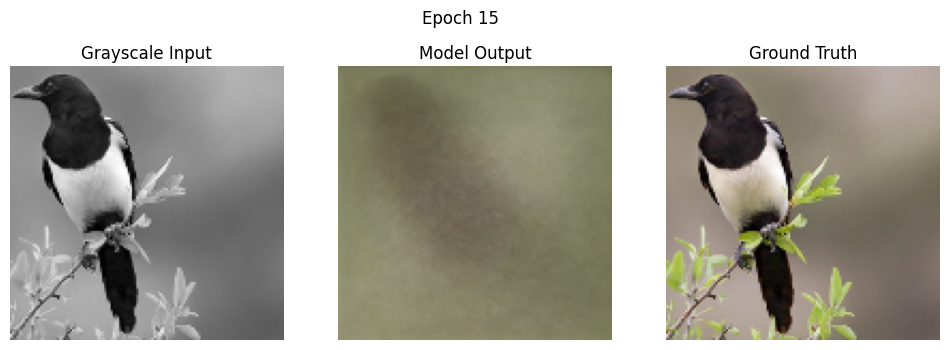

71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1520 - mse: 0.0307 - val_loss: 0.1597 - val_mse: 0.0339
Epoch 16/50
71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.1514 - mse: 0.0304 - val_loss: 0.1594 - val_mse: 0.0335
Epoch 17/50
71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.1493 - mse: 0.0301 - val_loss: 0.1590 - val_mse: 0.0328
Epoch 18/50
71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.1464 - mse: 0.0286 - val_loss: 0.1602 - val_mse: 0.0330
Epoch 19/50
71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.1445 - mse: 0.0283 - val_loss: 0.1605 - val_mse: 0.0329
Epoch 20/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


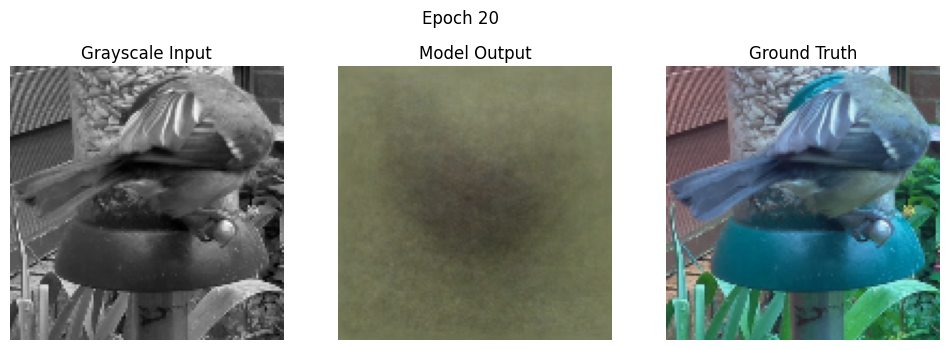

71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1417 - mse: 0.0278 - val_loss: 0.1611 - val_mse: 0.0324
Epoch 21/50
71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.1385 - mse: 0.0266 - val_loss: 0.1616 - val_mse: 0.0324
Epoch 22/50
71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.1362 - mse: 0.0263 - val_loss: 0.1619 - val_mse: 0.0324
Epoch 23/50
71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.1323 - mse: 0.0256 - val_loss: 0.1625 - val_mse: 0.0323
Epoch 24/50
71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.1291 - mse: 0.0252 - val_loss: 0.1643 - val_mse: 0.0324
Epoch 25/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


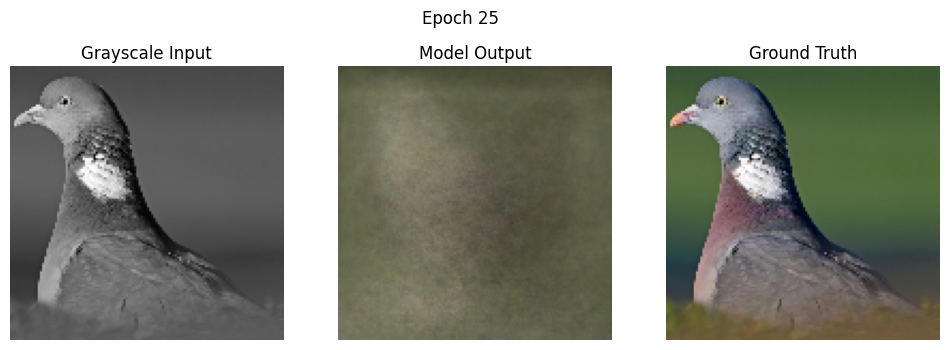

71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1243 - mse: 0.0242 - val_loss: 0.1655 - val_mse: 0.0325
Epoch 26/50
71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.1222 - mse: 0.0237 - val_loss: 0.1664 - val_mse: 0.0325
Epoch 27/50
71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.1171 - mse: 0.0224 - val_loss: 0.1685 - val_mse: 0.0331
Epoch 28/50
71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.1120 - mse: 0.0216 - val_loss: 0.1671 - val_mse: 0.0322
Epoch 29/50
71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.1068 - mse: 0.0205 - val_loss: 0.1677 - val_mse: 0.0324
Epoch 30/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


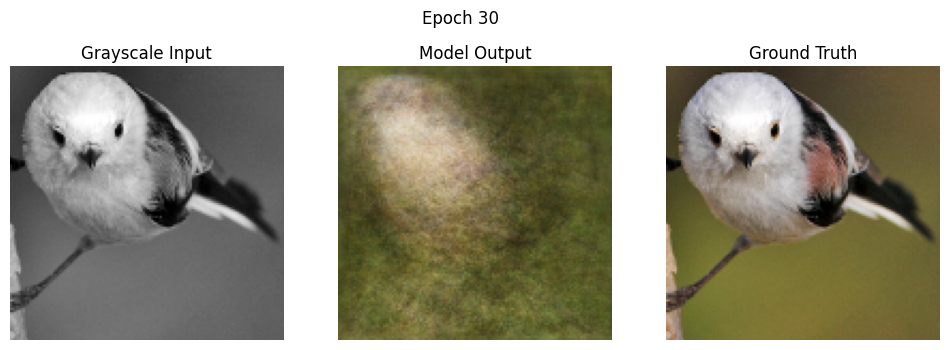

71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.1037 - mse: 0.0201 - val_loss: 0.1688 - val_mse: 0.0324
Epoch 31/50
71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0993 - mse: 0.0191 - val_loss: 0.1695 - val_mse: 0.0324
Epoch 32/50
71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0959 - mse: 0.0183 - val_loss: 0.1702 - val_mse: 0.0327
Epoch 33/50
71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.0920 - mse: 0.0174 - val_loss: 0.1704 - val_mse: 0.0323
Epoch 34/50
71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0886 - mse: 0.0168 - val_loss: 0.1707 - val_mse: 0.0325
Epoch 35/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


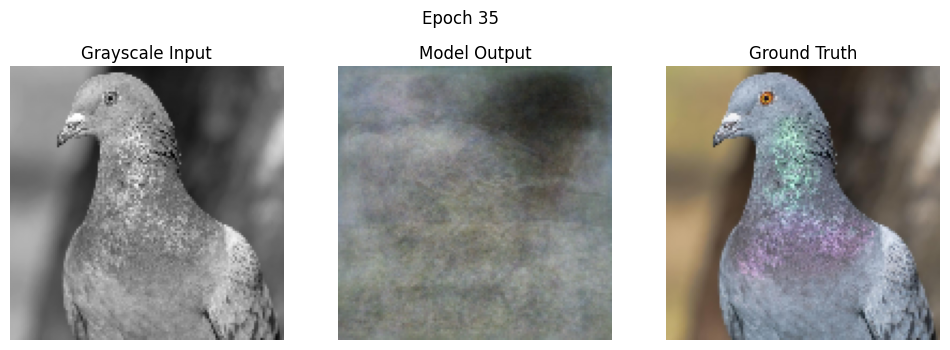

71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 39ms/step - loss: 0.0859 - mse: 0.0166 - val_loss: 0.1714 - val_mse: 0.0325
Epoch 36/50
71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0828 - mse: 0.0156 - val_loss: 0.1711 - val_mse: 0.0327
Epoch 37/50
71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0800 - mse: 0.0151 - val_loss: 0.1723 - val_mse: 0.0325
Epoch 38/50
71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0772 - mse: 0.0142 - val_loss: 0.1725 - val_mse: 0.0329
Epoch 39/50
71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0759 - mse: 0.0142 - val_loss: 0.1731 - val_mse: 0.0329
Epoch 40/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


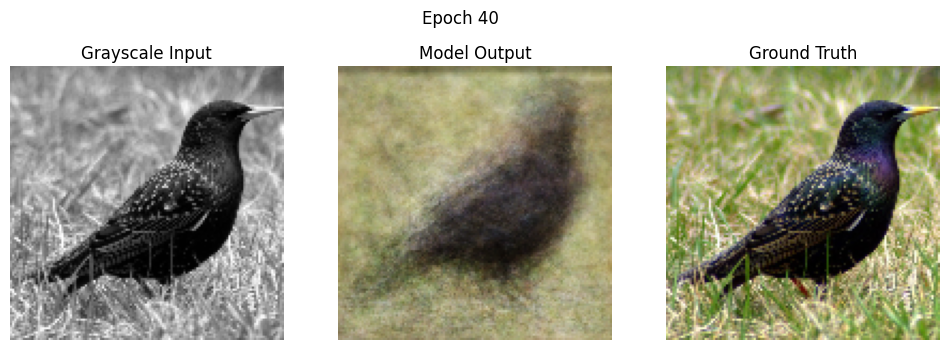

71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0735 - mse: 0.0137 - val_loss: 0.1725 - val_mse: 0.0327
Epoch 41/50
71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0711 - mse: 0.0130 - val_loss: 0.1727 - val_mse: 0.0328
Epoch 42/50
71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.0695 - mse: 0.0128 - val_loss: 0.1730 - val_mse: 0.0329
Epoch 43/50
71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0667 - mse: 0.0121 - val_loss: 0.1736 - val_mse: 0.0329
Epoch 44/50
71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0642 - mse: 0.0117 - val_loss: 0.1745 - val_mse: 0.0333
Epoch 45/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


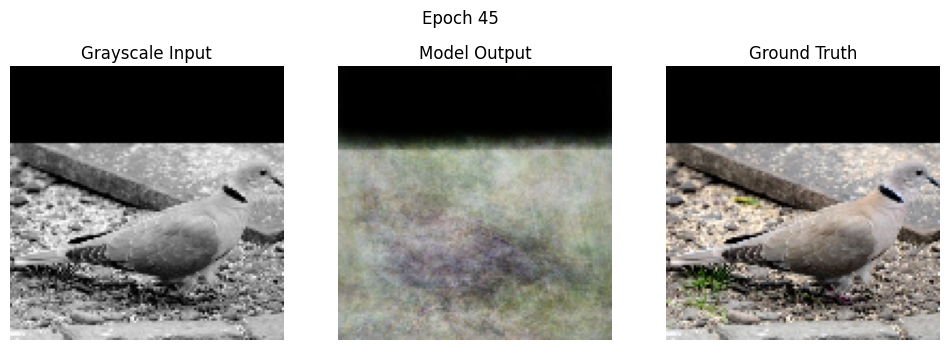

71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0641 - mse: 0.0115 - val_loss: 0.1737 - val_mse: 0.0330
Epoch 46/50
71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.0633 - mse: 0.0114 - val_loss: 0.1735 - val_mse: 0.0327
Epoch 47/50
71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.0612 - mse: 0.0109 - val_loss: 0.1737 - val_mse: 0.0330
Epoch 48/50
71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 34ms/step - loss: 0.0600 - mse: 0.0107 - val_loss: 0.1736 - val_mse: 0.0329
Epoch 49/50
71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - loss: 0.0589 - mse: 0.0106 - val_loss: 0.1736 - val_mse: 0.0328
Epoch 50/50
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


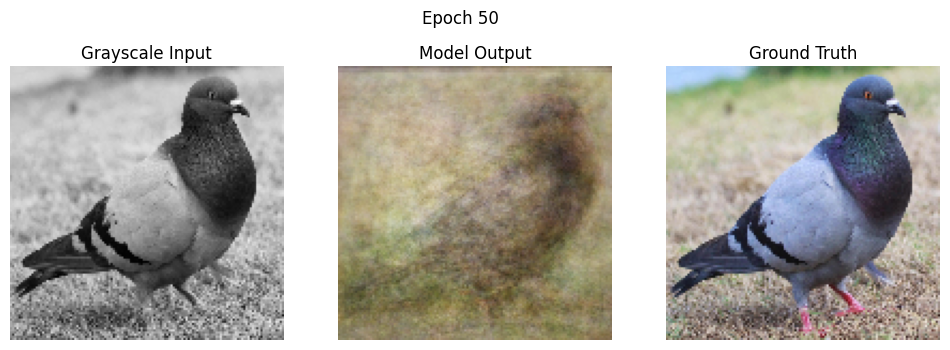

71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 0.0608 - mse: 0.0107 - val_loss: 0.1734 - val_mse: 0.0328


In [ ]:
image_callback = ImageCallback((X_val, y_val), interval=5)

vgg_model.fit(X_train, y_train,
          validation_data=(X_val, y_val),
          epochs=50,
          batch_size=32,
          callbacks=[image_callback])

#### Visualize Loss

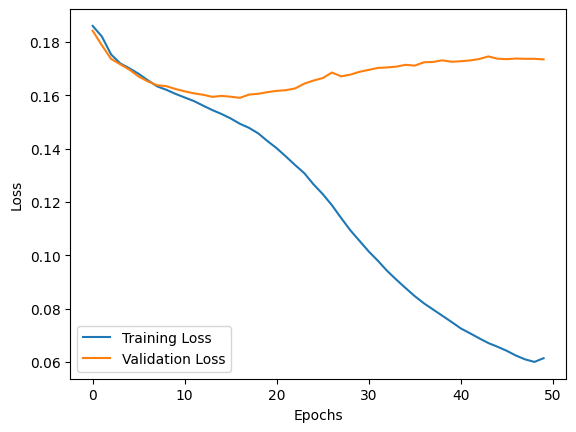

In [ ]:
plt.plot(vgg_model.history.history['loss'], label='Training Loss')
plt.plot(vgg_model.history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


#### Saving VGG model to drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

vgg_model.save('/content/drive/MyDrive/vgg_model.h5')

Mounted at /content/drive


### Our own model

#### Architecture of model

In [ ]:
def naive_colorization_model():
    inputs = layers.Input(shape=(128, 128, 1))

    x = layers.Conv2D(32, (3, 3), padding='same', activation='relu')(inputs)
    x = layers.MaxPooling2D((2, 2), padding='same')(x)

    x = layers.Conv2D(64, (3, 3), padding='same', activation='relu')(x)
    x = layers.MaxPooling2D((2, 2), padding='same')(x)

    x = layers.Conv2D(128, (3, 3), padding='same', activation='relu')(x)
    x = layers.MaxPooling2D((2, 2), padding='same')(x)

    x = layers.Conv2D(256, (3, 3), padding='same', activation='relu')(x)

    x = layers.Conv2D(512, (3, 3), padding='same', activation='relu')(x)

    x = layers.Conv2D(256, (3, 3), padding='same', activation='relu')(x)

    x = layers.UpSampling2D((2, 2))(x)
    x = layers.Conv2D(128, (3, 3), padding='same', activation='relu')(x)

    x = layers.UpSampling2D((2, 2))(x)
    x = layers.Conv2D(64, (3, 3), padding='same', activation='relu')(x)

    x = layers.UpSampling2D((2, 2))(x)
    x = layers.Conv2D(32, (3, 3), padding='same', activation='relu')(x)

    outputs = layers.Conv2D(3, (3, 3), activation='sigmoid', padding='same')(x)

    return models.Model(inputs, outputs)

model2 = naive_colorization_model()
model2.compile(optimizer='adam', loss=combined_loss, metrics=['mse'])

model2.summary()


Model: "functional_22"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)           │ (None, 128, 128, 1)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_35 (Conv2D)                   │ (None, 128, 128, 32)        │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_11 (MaxPooling2D)      │ (None, 64, 64, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_36 (Conv2D)                   │ (None, 64, 64, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_12 (MaxPooling2D)      │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_37 (Conv2D)                   │ (None, 32, 32, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_13 (MaxPooling2D)      │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_38 (Conv2D)                   │ (None, 16, 16, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_39 (Conv2D)                   │ (None, 16, 16, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_40 (Conv2D)                   │ (None, 16, 16, 256)         │       1,179,904 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ up_sampling2d_6 (UpSampling2D)       │ (None, 32, 32, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_41 (Conv2D)                   │ (None, 32, 32, 128)         │         295,040 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ up_sampling2d_7 (UpSampling2D)       │ (None, 64, 64, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_42 (Conv2D)                   │ (None, 64, 64, 64)          │          73,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ up_sampling2d_8 (UpSampling2D)       │ (None, 128, 128, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_43 (Conv2D)                   │ (None, 128, 128, 32)        │          18,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_44 (Conv2D)                   │ (None, 128, 128, 3)         │             867 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,136,067 (11.96 MB)

 Trainable params: 3,136,067 (11.96 MB)

 Non-trainable params: 0 (0.00 B)

#### Train the model

Epoch 1/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 8s 42ms/step - loss: 0.1739 - mse: 0.0515 - val_loss: 0.1258 - val_mse: 0.0207
Epoch 2/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.1184 - mse: 0.0186 - val_loss: 0.1052 - val_mse: 0.0164
Epoch 3/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.1007 - mse: 0.0149 - val_loss: 0.0926 - val_mse: 0.0155
Epoch 4/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0908 - mse: 0.0142 - val_loss: 0.0855 - val_mse: 0.0140
Epoch 5/70
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 568ms/step


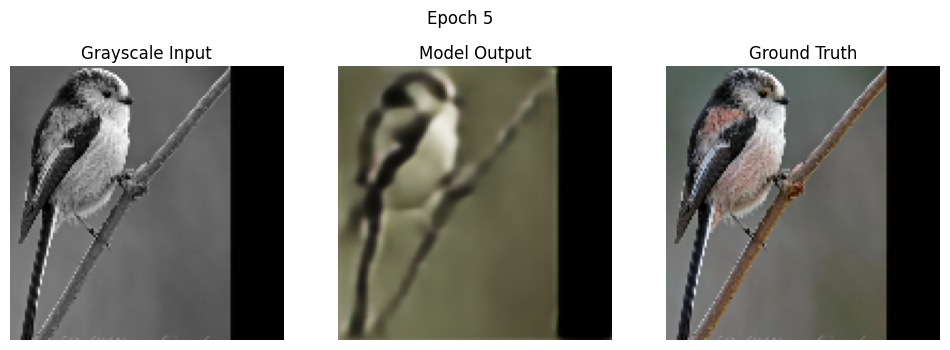

71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 30ms/step - loss: 0.0845 - mse: 0.0134 - val_loss: 0.0806 - val_mse: 0.0128
Epoch 6/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0809 - mse: 0.0130 - val_loss: 0.0794 - val_mse: 0.0133
Epoch 7/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0777 - mse: 0.0128 - val_loss: 0.0749 - val_mse: 0.0124
Epoch 8/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0769 - mse: 0.0134 - val_loss: 0.0742 - val_mse: 0.0124
Epoch 9/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0727 - mse: 0.0118 - val_loss: 0.0744 - val_mse: 0.0125
Epoch 10/70
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


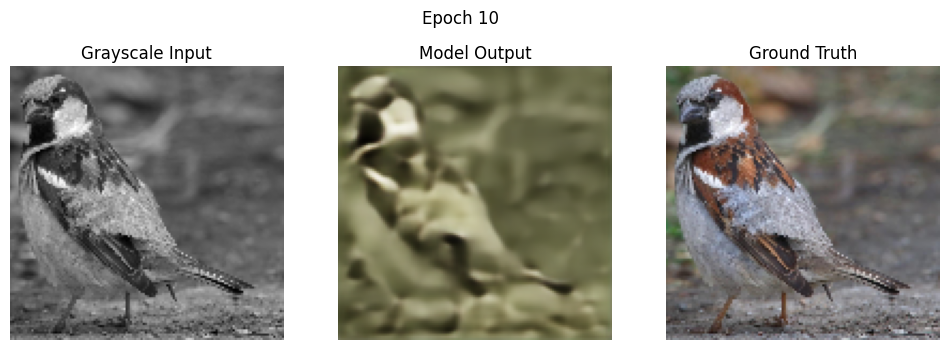

71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0723 - mse: 0.0122 - val_loss: 0.0710 - val_mse: 0.0119
Epoch 11/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0719 - mse: 0.0122 - val_loss: 0.0699 - val_mse: 0.0117
Epoch 12/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0694 - mse: 0.0116 - val_loss: 0.0688 - val_mse: 0.0116
Epoch 13/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0697 - mse: 0.0118 - val_loss: 0.0682 - val_mse: 0.0114
Epoch 14/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0695 - mse: 0.0118 - val_loss: 0.0672 - val_mse: 0.0115
Epoch 15/70
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


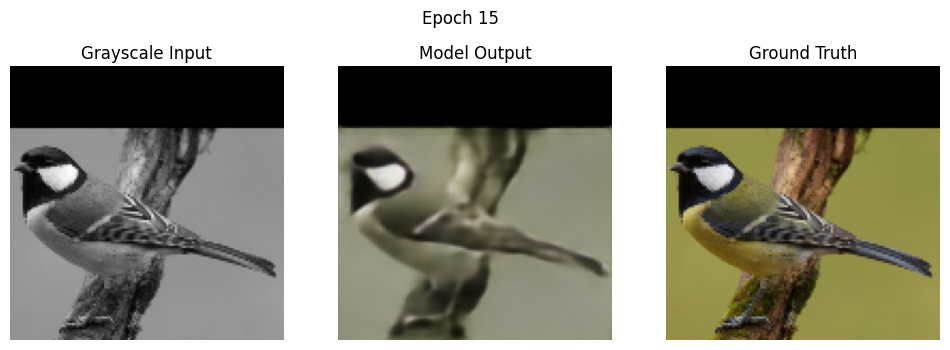

71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 0.0671 - mse: 0.0114 - val_loss: 0.0674 - val_mse: 0.0114
Epoch 16/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0664 - mse: 0.0113 - val_loss: 0.0662 - val_mse: 0.0114
Epoch 17/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0660 - mse: 0.0112 - val_loss: 0.0657 - val_mse: 0.0115
Epoch 18/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0654 - mse: 0.0117 - val_loss: 0.0646 - val_mse: 0.0115
Epoch 19/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0640 - mse: 0.0112 - val_loss: 0.0643 - val_mse: 0.0113
Epoch 20/70
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


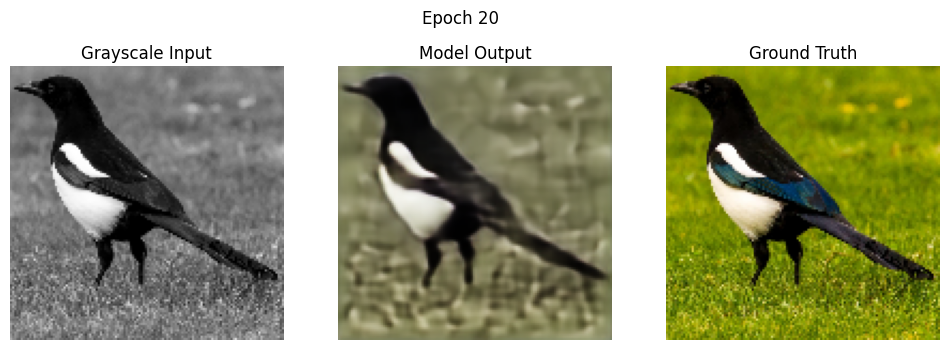

71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0641 - mse: 0.0112 - val_loss: 0.0641 - val_mse: 0.0113
Epoch 21/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0638 - mse: 0.0112 - val_loss: 0.0638 - val_mse: 0.0112
Epoch 22/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0629 - mse: 0.0108 - val_loss: 0.0640 - val_mse: 0.0121
Epoch 23/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0630 - mse: 0.0110 - val_loss: 0.0621 - val_mse: 0.0107
Epoch 24/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0619 - mse: 0.0107 - val_loss: 0.0617 - val_mse: 0.0109
Epoch 25/70
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


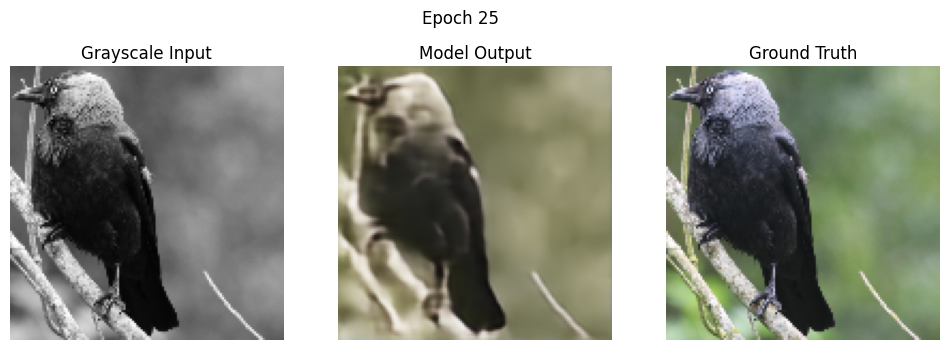

71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0616 - mse: 0.0108 - val_loss: 0.0617 - val_mse: 0.0110
Epoch 26/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0615 - mse: 0.0109 - val_loss: 0.0609 - val_mse: 0.0112
Epoch 27/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0604 - mse: 0.0105 - val_loss: 0.0610 - val_mse: 0.0111
Epoch 28/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0597 - mse: 0.0104 - val_loss: 0.0618 - val_mse: 0.0106
Epoch 29/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0598 - mse: 0.0105 - val_loss: 0.0597 - val_mse: 0.0106
Epoch 30/70
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


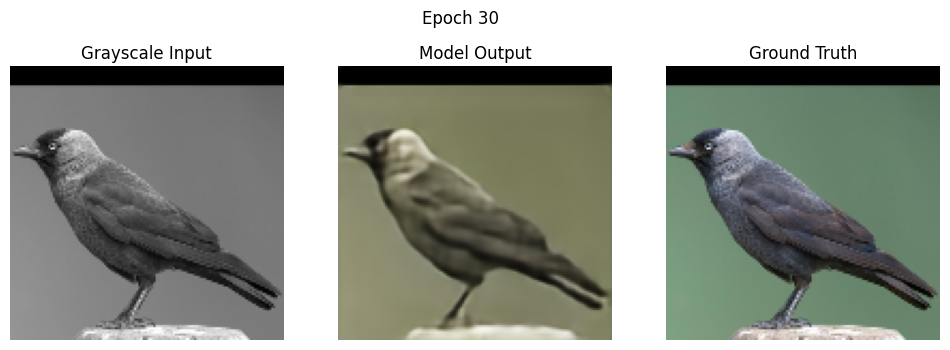

71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0594 - mse: 0.0107 - val_loss: 0.0606 - val_mse: 0.0110
Epoch 31/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0597 - mse: 0.0107 - val_loss: 0.0599 - val_mse: 0.0108
Epoch 32/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0593 - mse: 0.0106 - val_loss: 0.0596 - val_mse: 0.0106
Epoch 33/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0580 - mse: 0.0104 - val_loss: 0.0605 - val_mse: 0.0112
Epoch 34/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0574 - mse: 0.0103 - val_loss: 0.0588 - val_mse: 0.0104
Epoch 35/70
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


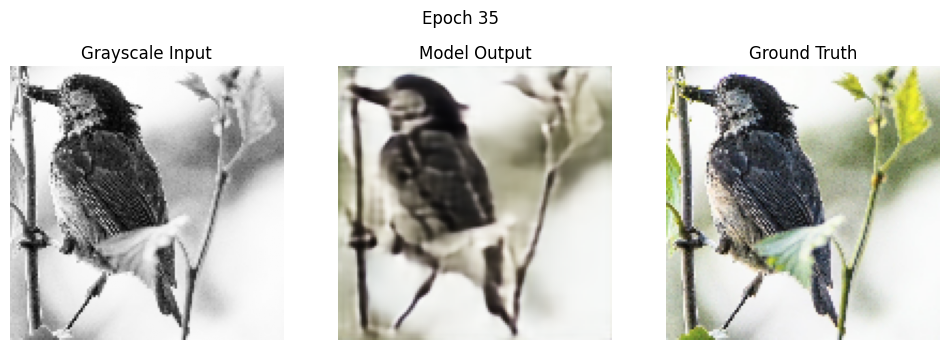

71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0575 - mse: 0.0100 - val_loss: 0.0591 - val_mse: 0.0108
Epoch 36/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0573 - mse: 0.0103 - val_loss: 0.0585 - val_mse: 0.0109
Epoch 37/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0566 - mse: 0.0101 - val_loss: 0.0583 - val_mse: 0.0108
Epoch 38/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0571 - mse: 0.0105 - val_loss: 0.0593 - val_mse: 0.0114
Epoch 39/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0563 - mse: 0.0103 - val_loss: 0.0573 - val_mse: 0.0105
Epoch 40/70
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


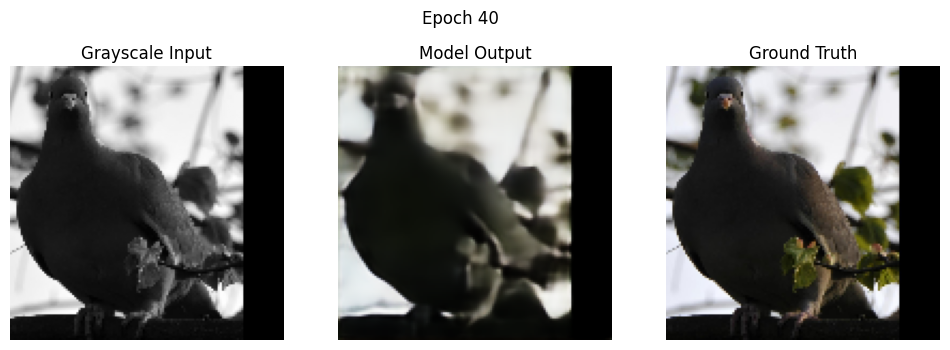

71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 0.0560 - mse: 0.0101 - val_loss: 0.0580 - val_mse: 0.0106
Epoch 41/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0558 - mse: 0.0101 - val_loss: 0.0569 - val_mse: 0.0103
Epoch 42/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0558 - mse: 0.0099 - val_loss: 0.0575 - val_mse: 0.0108
Epoch 43/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0561 - mse: 0.0100 - val_loss: 0.0568 - val_mse: 0.0103
Epoch 44/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0557 - mse: 0.0101 - val_loss: 0.0563 - val_mse: 0.0103
Epoch 45/70
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


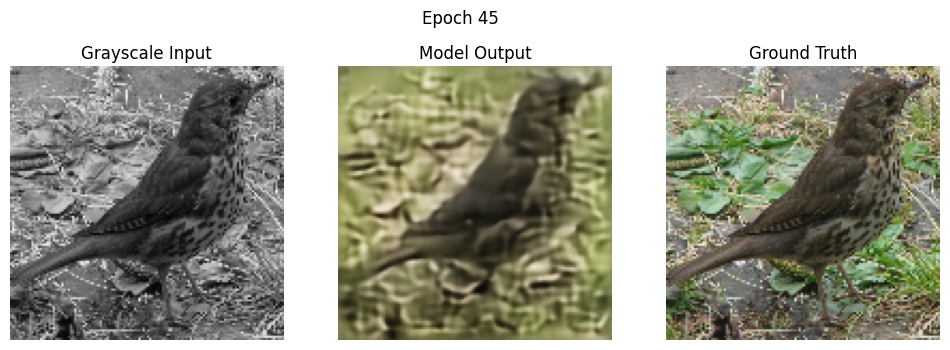

71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0554 - mse: 0.0102 - val_loss: 0.0566 - val_mse: 0.0102
Epoch 46/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0541 - mse: 0.0097 - val_loss: 0.0575 - val_mse: 0.0106
Epoch 47/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0553 - mse: 0.0099 - val_loss: 0.0568 - val_mse: 0.0103
Epoch 48/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0548 - mse: 0.0100 - val_loss: 0.0560 - val_mse: 0.0103
Epoch 49/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0545 - mse: 0.0097 - val_loss: 0.0585 - val_mse: 0.0118
Epoch 50/70
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


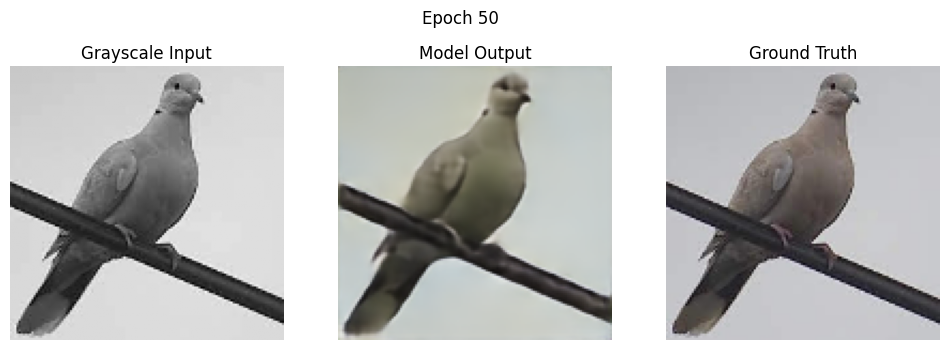

71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0540 - mse: 0.0097 - val_loss: 0.0560 - val_mse: 0.0104
Epoch 51/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0536 - mse: 0.0094 - val_loss: 0.0559 - val_mse: 0.0104
Epoch 52/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0548 - mse: 0.0097 - val_loss: 0.0557 - val_mse: 0.0104
Epoch 53/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0550 - mse: 0.0099 - val_loss: 0.0552 - val_mse: 0.0101
Epoch 54/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0538 - mse: 0.0097 - val_loss: 0.0564 - val_mse: 0.0108
Epoch 55/70
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


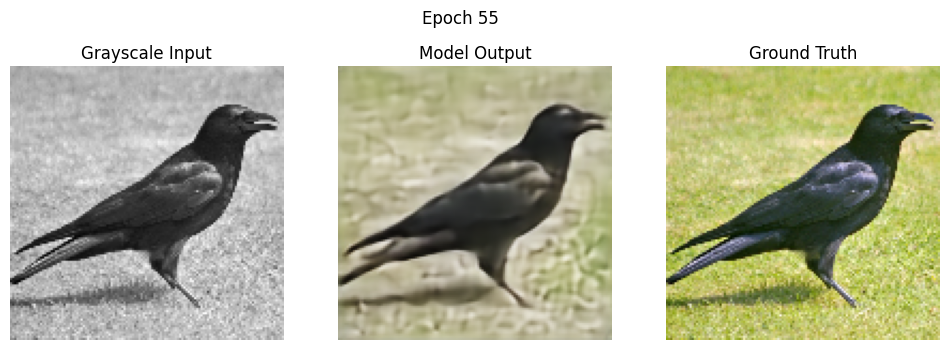

71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0535 - mse: 0.0098 - val_loss: 0.0553 - val_mse: 0.0102
Epoch 56/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0538 - mse: 0.0096 - val_loss: 0.0550 - val_mse: 0.0101
Epoch 57/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0531 - mse: 0.0093 - val_loss: 0.0595 - val_mse: 0.0117
Epoch 58/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0547 - mse: 0.0096 - val_loss: 0.0553 - val_mse: 0.0101
Epoch 59/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0528 - mse: 0.0092 - val_loss: 0.0558 - val_mse: 0.0106
Epoch 60/70
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


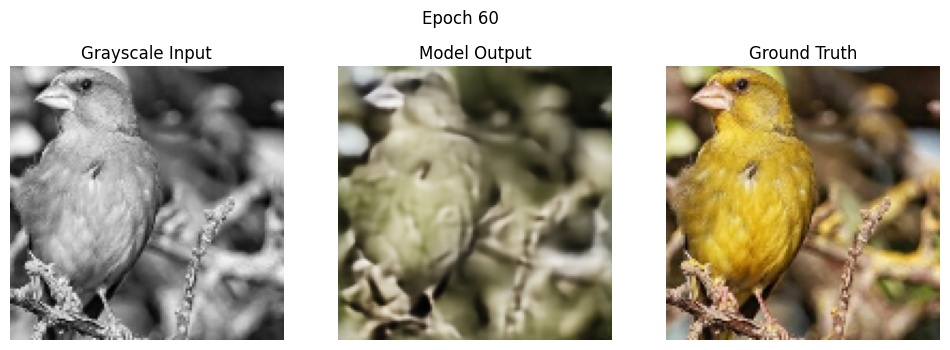

71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 24ms/step - loss: 0.0533 - mse: 0.0098 - val_loss: 0.0553 - val_mse: 0.0103
Epoch 61/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0535 - mse: 0.0097 - val_loss: 0.0544 - val_mse: 0.0101
Epoch 62/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0530 - mse: 0.0095 - val_loss: 0.0549 - val_mse: 0.0101
Epoch 63/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 18ms/step - loss: 0.0523 - mse: 0.0093 - val_loss: 0.0553 - val_mse: 0.0100
Epoch 64/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0532 - mse: 0.0097 - val_loss: 0.0546 - val_mse: 0.0101
Epoch 65/70
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


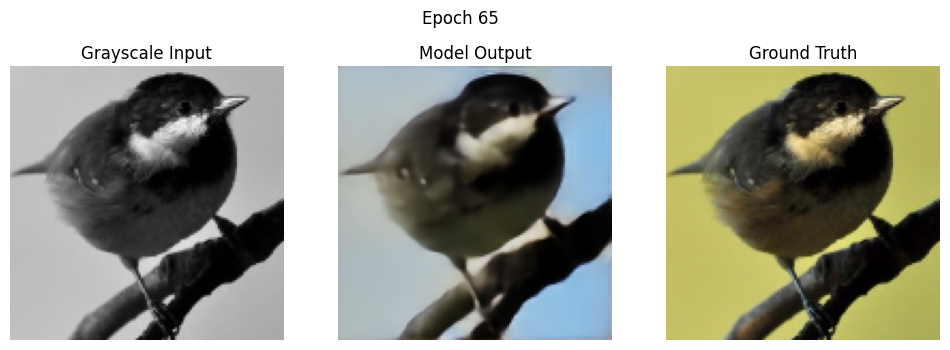

71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0522 - mse: 0.0092 - val_loss: 0.0551 - val_mse: 0.0102
Epoch 66/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0522 - mse: 0.0093 - val_loss: 0.0562 - val_mse: 0.0111
Epoch 67/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0526 - mse: 0.0096 - val_loss: 0.0546 - val_mse: 0.0101
Epoch 68/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0520 - mse: 0.0091 - val_loss: 0.0544 - val_mse: 0.0101
Epoch 69/70
71/71 ━━━━━━━━━━━━━━━━━━━━ 1s 19ms/step - loss: 0.0511 - mse: 0.0091 - val_loss: 0.0549 - val_mse: 0.0105
Epoch 70/70
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step


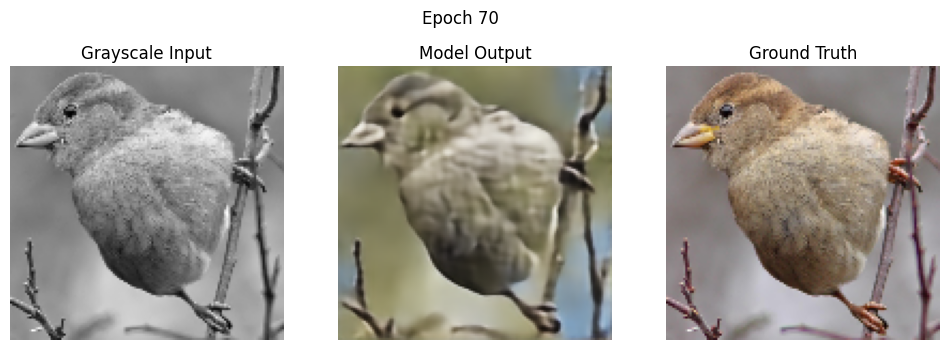

71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 23ms/step - loss: 0.0513 - mse: 0.0089 - val_loss: 0.0556 - val_mse: 0.0107


In [ ]:
image_callback = ImageCallback((X_val, y_val), interval=5)


history2 = model2.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=70,
    batch_size=32,
    callbacks=[image_callback]
)


#### Visualize loss

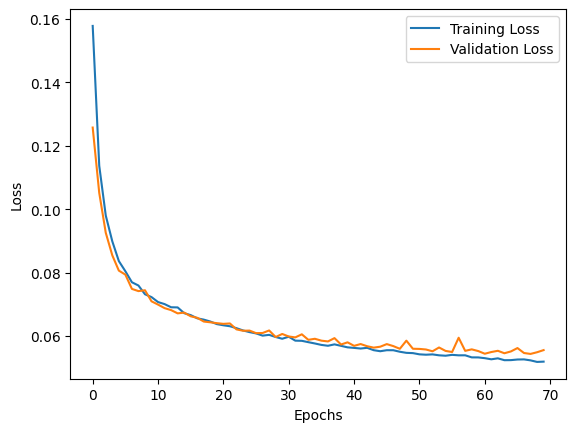

In [ ]:
plt.plot(history2.history['loss'], label='Training Loss')
plt.plot(history2.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


#### Saving model to drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

model2.save('/content/drive/MyDrive/own_model.h5')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### UNET

#### Architecture of model

In [ ]:
def build_unet():
    inputs = layers.Input(shape=(128, 128, 1))

    conv1 = layers.Conv2D(64, (3,3), padding='same', activation='relu')(inputs)
    conv1 = layers.Conv2D(64, (3,3), padding='same', activation='relu')(conv1)
    pool1 = layers.MaxPooling2D((2,2))(conv1)

    conv2 = layers.Conv2D(128, (3,3), padding='same', activation='relu')(pool1)
    conv2 = layers.Conv2D(128, (3,3), padding='same', activation='relu')(conv2)
    pool2 = layers.MaxPooling2D((2,2))(conv2)

    conv3 = layers.Conv2D(256, (3,3), padding='same', activation='relu')(pool2)
    conv3 = layers.Conv2D(256, (3,3), padding='same', activation='relu')(conv3)
    pool3 = layers.MaxPooling2D((2,2))(conv3)

    conv4 = layers.Conv2D(512, (3,3), padding='same', activation='relu')(pool3)
    conv4 = layers.Conv2D(512, (3,3), padding='same', activation='relu')(conv4)

    up3 = layers.UpSampling2D((2,2))(conv4)
    up3 = layers.Conv2D(256, (3,3), padding='same', activation='relu')(up3)
    up3 = layers.concatenate([up3, conv3])  # Fix skip connection
    up3 = layers.Conv2D(256, (3,3), padding='same', activation='relu')(up3)

    up2 = layers.UpSampling2D((2,2))(up3)
    up2 = layers.Conv2D(128, (3,3), padding='same', activation='relu')(up2)
    up2 = layers.concatenate([up2, conv2])  # Fix skip connection
    up2 = layers.Conv2D(128, (3,3), padding='same', activation='relu')(up2)

    up1 = layers.UpSampling2D((2,2))(up2)
    up1 = layers.Conv2D(64, (3,3), padding='same', activation='relu')(up1)
    up1 = layers.concatenate([up1, conv1])  # Fix skip connection
    up1 = layers.Conv2D(64, (3,3), padding='same', activation='relu')(up1)

    outputs = layers.Conv2D(3, (3,3), activation='sigmoid', padding='same')(up1)

    model = models.Model(inputs, outputs)
    return model

unet_model = build_unet()
unet_model.compile(optimizer='adam', loss=combined_loss, metrics=['mse'])
unet_model.summary()



Model: "functional_21"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 128, 128, 1)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_20 (Conv2D)        │ (None, 128, 128, 64)   │            640 │ input_layer_2[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_21 (Conv2D)        │ (None, 128, 128, 64)   │         36,928 │ conv2d_20[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_8           │ (None, 64, 64, 64)     │              0 │ conv2d_21[0][0]        │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_22 (Conv2D)        │ (None, 64, 64, 128)    │         73,856 │ max_pooling2d_8[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_23 (Conv2D)        │ (None, 64, 64, 128)    │        147,584 │ conv2d_22[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_9           │ (None, 32, 32, 128)    │              0 │ conv2d_23[0][0]        │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_24 (Conv2D)        │ (None, 32, 32, 256)    │        295,168 │ max_pooling2d_9[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_25 (Conv2D)        │ (None, 32, 32, 256)    │        590,080 │ conv2d_24[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_10          │ (None, 16, 16, 256)    │              0 │ conv2d_25[0][0]        │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_26 (Conv2D)        │ (None, 16, 16, 512)    │      1,180,160 │ max_pooling2d_10[0][0] │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_27 (Conv2D)        │ (None, 16, 16, 512)    │      2,359,808 │ conv2d_26[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ up_sampling2d_3           │ (None, 32, 32, 512)    │              0 │ conv2d_27[0][0]        │
│ (UpSampling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_28 (Conv2D)        │ (None, 32, 32, 256)    │      1,179,904 │ up_sampling2d_3[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate (Concatenate) │ (None, 32, 32, 512)    │              0 │ conv2d_28[0][0],       │
│                           │                        │                │ conv2d_25[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_29 (Conv2D)        │ (None, 32, 32, 256)    │      1,179,904 │ concatenate[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ up_sampling2d_4      

 Total params: 7,783,427 (29.69 MB)

 Trainable params: 7,783,427 (29.69 MB)

 Non-trainable params: 0 (0.00 B)

#### Train the model

Epoch 1/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 18s 88ms/step - loss: 0.1160 - mse: 0.0410 - val_loss: 0.0223 - val_mse: 0.0079
Epoch 2/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0203 - mse: 0.0077 - val_loss: 0.0183 - val_mse: 0.0071
Epoch 3/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0182 - mse: 0.0070 - val_loss: 0.0188 - val_mse: 0.0072
Epoch 4/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0180 - mse: 0.0071 - val_loss: 0.0181 - val_mse: 0.0071
Epoch 5/75
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 896ms/step


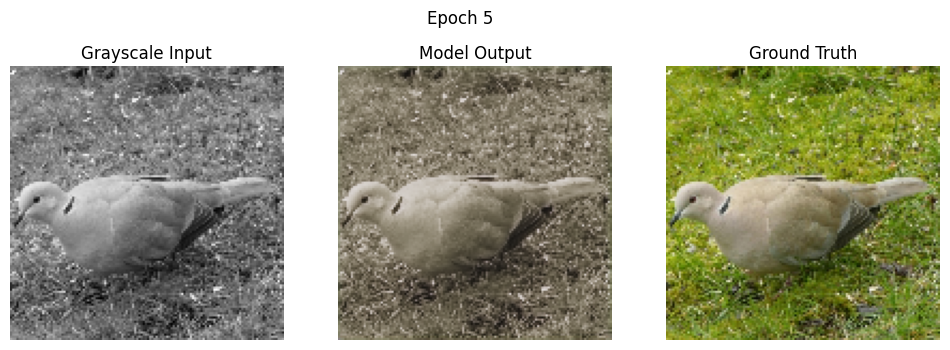

71/71 ━━━━━━━━━━━━━━━━━━━━ 5s 68ms/step - loss: 0.0179 - mse: 0.0071 - val_loss: 0.0178 - val_mse: 0.0070
Epoch 6/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0175 - mse: 0.0069 - val_loss: 0.0178 - val_mse: 0.0070
Epoch 7/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0177 - mse: 0.0071 - val_loss: 0.0175 - val_mse: 0.0069
Epoch 8/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0169 - mse: 0.0066 - val_loss: 0.0179 - val_mse: 0.0072
Epoch 9/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0175 - mse: 0.0069 - val_loss: 0.0172 - val_mse: 0.0068
Epoch 10/75
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


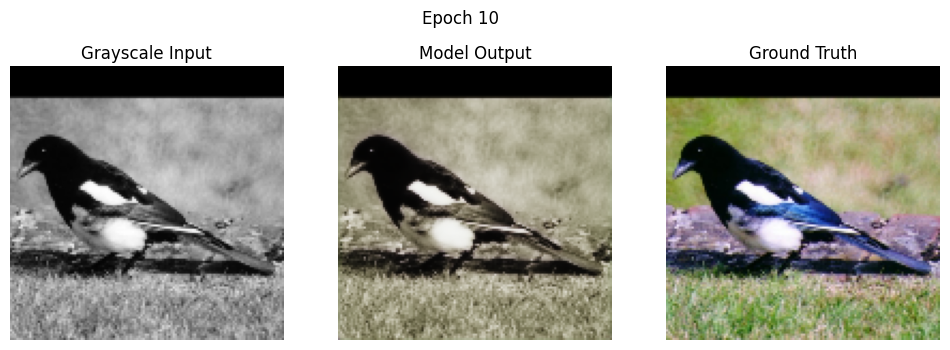

71/71 ━━━━━━━━━━━━━━━━━━━━ 4s 52ms/step - loss: 0.0169 - mse: 0.0066 - val_loss: 0.0170 - val_mse: 0.0066
Epoch 11/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0166 - mse: 0.0065 - val_loss: 0.0174 - val_mse: 0.0068
Epoch 12/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0174 - mse: 0.0069 - val_loss: 0.0170 - val_mse: 0.0067
Epoch 13/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0164 - mse: 0.0065 - val_loss: 0.0173 - val_mse: 0.0068
Epoch 14/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0170 - mse: 0.0068 - val_loss: 0.0171 - val_mse: 0.0068
Epoch 15/75
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


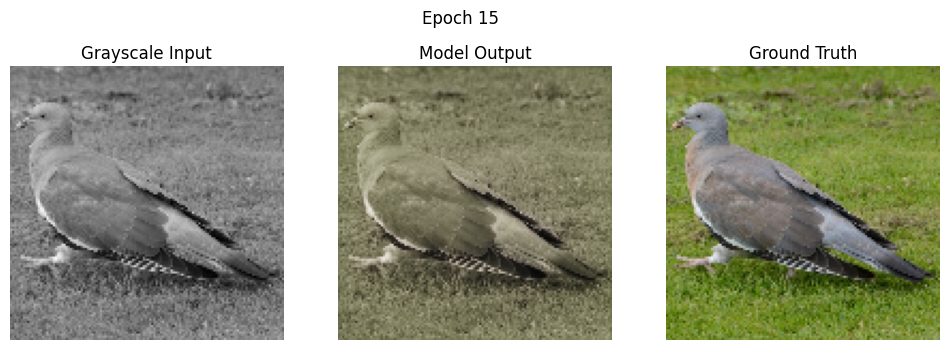

71/71 ━━━━━━━━━━━━━━━━━━━━ 4s 52ms/step - loss: 0.0174 - mse: 0.0070 - val_loss: 0.0168 - val_mse: 0.0065
Epoch 16/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0166 - mse: 0.0065 - val_loss: 0.0170 - val_mse: 0.0066
Epoch 17/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0168 - mse: 0.0067 - val_loss: 0.0177 - val_mse: 0.0070
Epoch 18/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0169 - mse: 0.0067 - val_loss: 0.0169 - val_mse: 0.0066
Epoch 19/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0167 - mse: 0.0066 - val_loss: 0.0169 - val_mse: 0.0066
Epoch 20/75
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step


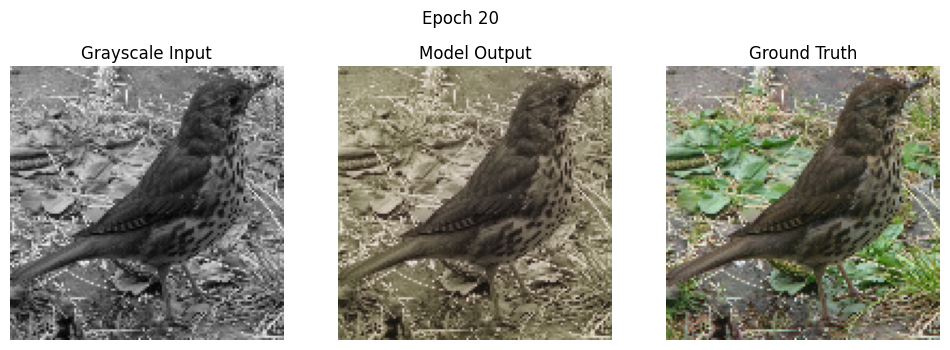

71/71 ━━━━━━━━━━━━━━━━━━━━ 4s 52ms/step - loss: 0.0161 - mse: 0.0061 - val_loss: 0.0169 - val_mse: 0.0066
Epoch 21/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0164 - mse: 0.0063 - val_loss: 0.0169 - val_mse: 0.0066
Epoch 22/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0165 - mse: 0.0065 - val_loss: 0.0167 - val_mse: 0.0066
Epoch 23/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0164 - mse: 0.0064 - val_loss: 0.0167 - val_mse: 0.0065
Epoch 24/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0171 - mse: 0.0067 - val_loss: 0.0167 - val_mse: 0.0066
Epoch 25/75
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


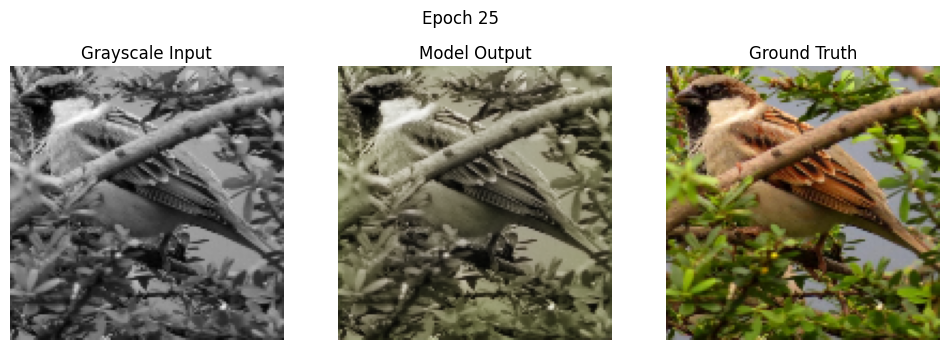

71/71 ━━━━━━━━━━━━━━━━━━━━ 4s 52ms/step - loss: 0.0160 - mse: 0.0061 - val_loss: 0.0169 - val_mse: 0.0066
Epoch 26/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0166 - mse: 0.0064 - val_loss: 0.0168 - val_mse: 0.0066
Epoch 27/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0164 - mse: 0.0064 - val_loss: 0.0170 - val_mse: 0.0068
Epoch 28/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0169 - mse: 0.0067 - val_loss: 0.0165 - val_mse: 0.0064
Epoch 29/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0162 - mse: 0.0063 - val_loss: 0.0166 - val_mse: 0.0065
Epoch 30/75
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


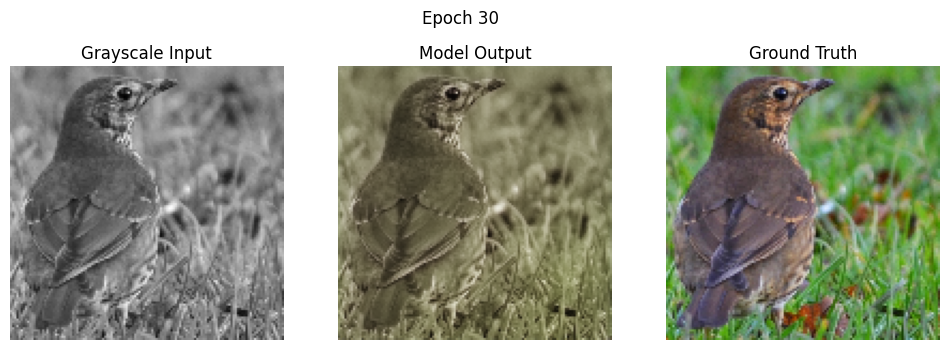

71/71 ━━━━━━━━━━━━━━━━━━━━ 4s 52ms/step - loss: 0.0165 - mse: 0.0063 - val_loss: 0.0165 - val_mse: 0.0064
Epoch 31/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0163 - mse: 0.0063 - val_loss: 0.0165 - val_mse: 0.0064
Epoch 32/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0170 - mse: 0.0068 - val_loss: 0.0164 - val_mse: 0.0063
Epoch 33/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0160 - mse: 0.0063 - val_loss: 0.0168 - val_mse: 0.0066
Epoch 34/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0156 - mse: 0.0061 - val_loss: 0.0165 - val_mse: 0.0064
Epoch 35/75
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


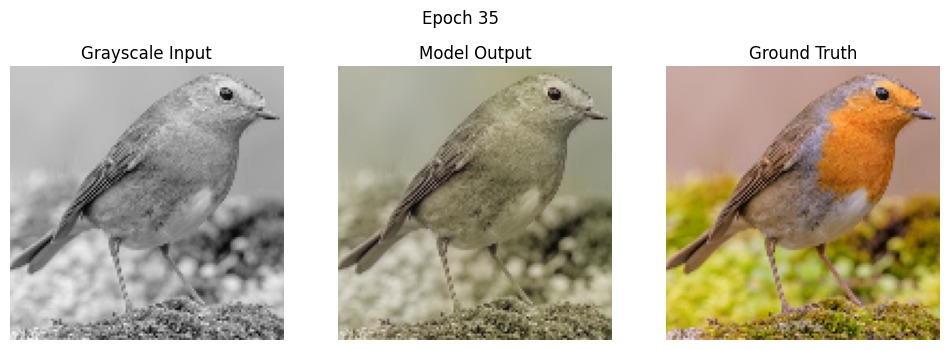

71/71 ━━━━━━━━━━━━━━━━━━━━ 4s 52ms/step - loss: 0.0165 - mse: 0.0064 - val_loss: 0.0164 - val_mse: 0.0063
Epoch 36/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0159 - mse: 0.0061 - val_loss: 0.0165 - val_mse: 0.0064
Epoch 37/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0162 - mse: 0.0063 - val_loss: 0.0170 - val_mse: 0.0067
Epoch 38/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0158 - mse: 0.0060 - val_loss: 0.0163 - val_mse: 0.0063
Epoch 39/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0161 - mse: 0.0064 - val_loss: 0.0164 - val_mse: 0.0063
Epoch 40/75
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


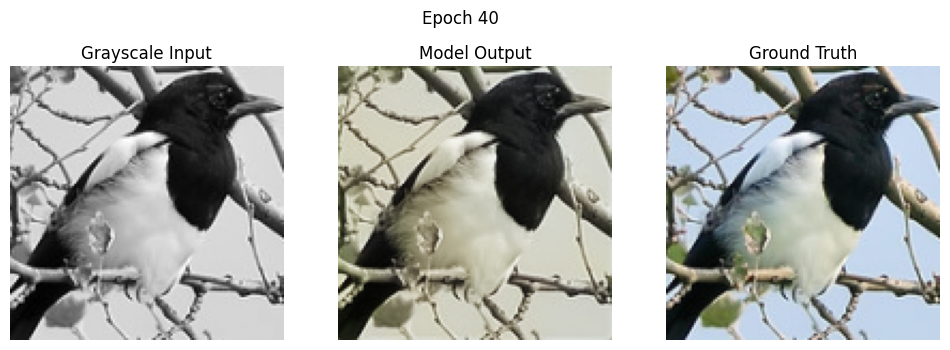

71/71 ━━━━━━━━━━━━━━━━━━━━ 4s 52ms/step - loss: 0.0159 - mse: 0.0061 - val_loss: 0.0163 - val_mse: 0.0062
Epoch 41/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0157 - mse: 0.0059 - val_loss: 0.0168 - val_mse: 0.0066
Epoch 42/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0160 - mse: 0.0062 - val_loss: 0.0165 - val_mse: 0.0063
Epoch 43/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - loss: 0.0158 - mse: 0.0060 - val_loss: 0.0163 - val_mse: 0.0063
Epoch 44/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0155 - mse: 0.0058 - val_loss: 0.0161 - val_mse: 0.0061
Epoch 45/75
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


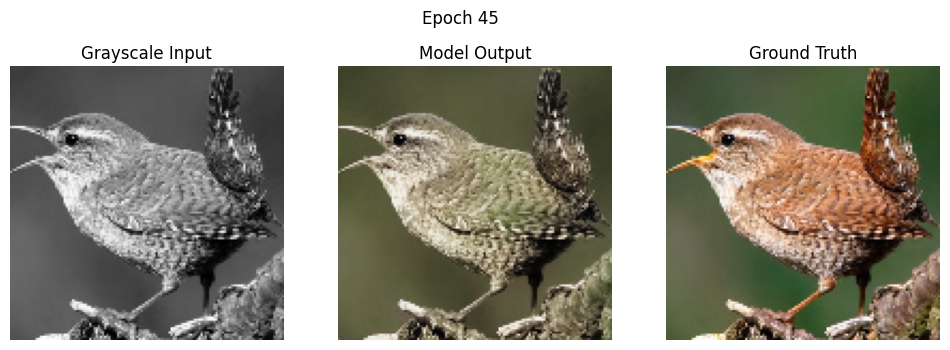

71/71 ━━━━━━━━━━━━━━━━━━━━ 4s 52ms/step - loss: 0.0157 - mse: 0.0060 - val_loss: 0.0161 - val_mse: 0.0061
Epoch 46/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0151 - mse: 0.0055 - val_loss: 0.0163 - val_mse: 0.0062
Epoch 47/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0152 - mse: 0.0056 - val_loss: 0.0165 - val_mse: 0.0064
Epoch 48/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0161 - mse: 0.0061 - val_loss: 0.0165 - val_mse: 0.0063
Epoch 49/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0160 - mse: 0.0060 - val_loss: 0.0161 - val_mse: 0.0061
Epoch 50/75
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


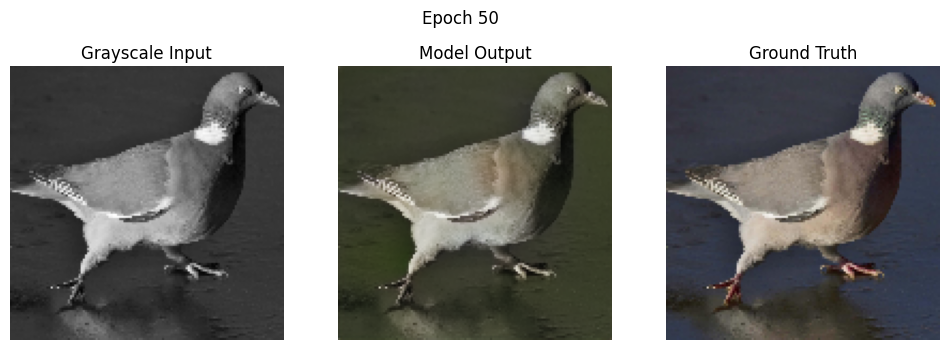

71/71 ━━━━━━━━━━━━━━━━━━━━ 4s 51ms/step - loss: 0.0154 - mse: 0.0056 - val_loss: 0.0164 - val_mse: 0.0063
Epoch 51/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0155 - mse: 0.0057 - val_loss: 0.0161 - val_mse: 0.0061
Epoch 52/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0151 - mse: 0.0053 - val_loss: 0.0162 - val_mse: 0.0061
Epoch 53/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0149 - mse: 0.0052 - val_loss: 0.0165 - val_mse: 0.0063
Epoch 54/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0146 - mse: 0.0051 - val_loss: 0.0163 - val_mse: 0.0061
Epoch 55/75
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


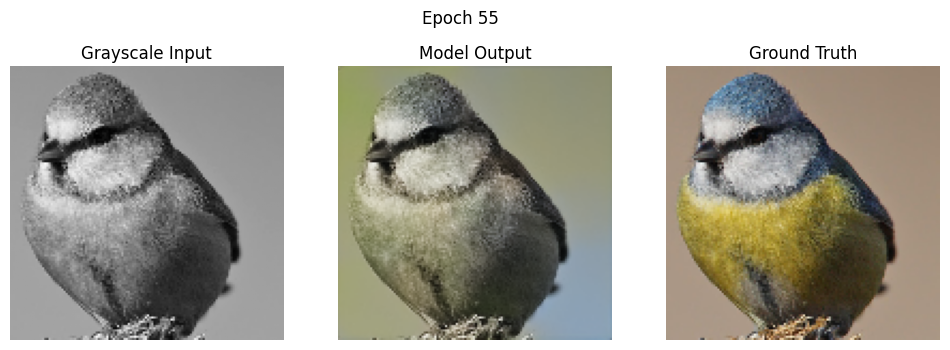

71/71 ━━━━━━━━━━━━━━━━━━━━ 4s 52ms/step - loss: 0.0146 - mse: 0.0050 - val_loss: 0.0162 - val_mse: 0.0061
Epoch 56/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0142 - mse: 0.0047 - val_loss: 0.0165 - val_mse: 0.0062
Epoch 57/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0144 - mse: 0.0049 - val_loss: 0.0159 - val_mse: 0.0058
Epoch 58/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0133 - mse: 0.0041 - val_loss: 0.0164 - val_mse: 0.0060
Epoch 59/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0132 - mse: 0.0041 - val_loss: 0.0162 - val_mse: 0.0060
Epoch 60/75
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step


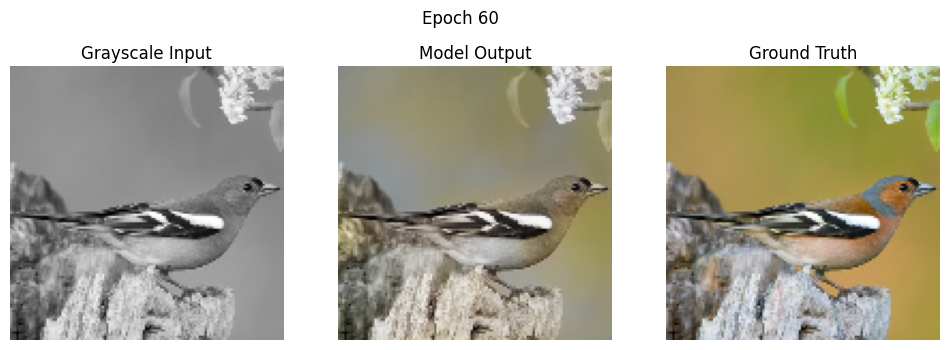

71/71 ━━━━━━━━━━━━━━━━━━━━ 4s 52ms/step - loss: 0.0131 - mse: 0.0040 - val_loss: 0.0162 - val_mse: 0.0060
Epoch 61/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0123 - mse: 0.0036 - val_loss: 0.0163 - val_mse: 0.0060
Epoch 62/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0120 - mse: 0.0033 - val_loss: 0.0167 - val_mse: 0.0062
Epoch 63/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0118 - mse: 0.0032 - val_loss: 0.0165 - val_mse: 0.0061
Epoch 64/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0110 - mse: 0.0028 - val_loss: 0.0164 - val_mse: 0.0060
Epoch 65/75
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


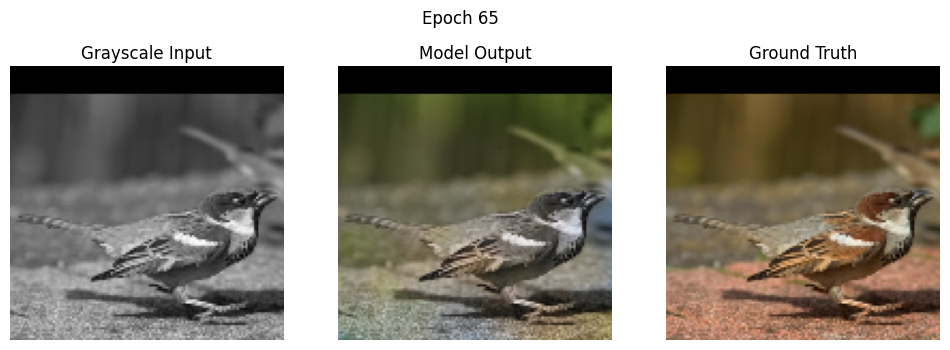

71/71 ━━━━━━━━━━━━━━━━━━━━ 4s 52ms/step - loss: 0.0107 - mse: 0.0027 - val_loss: 0.0170 - val_mse: 0.0062
Epoch 66/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0103 - mse: 0.0025 - val_loss: 0.0169 - val_mse: 0.0062
Epoch 67/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0100 - mse: 0.0023 - val_loss: 0.0168 - val_mse: 0.0061
Epoch 68/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0094 - mse: 0.0021 - val_loss: 0.0170 - val_mse: 0.0062
Epoch 69/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0092 - mse: 0.0020 - val_loss: 0.0171 - val_mse: 0.0062
Epoch 70/75
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


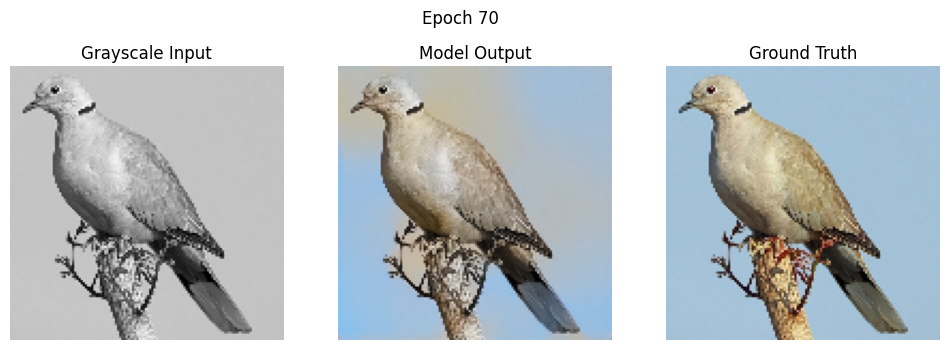

71/71 ━━━━━━━━━━━━━━━━━━━━ 4s 52ms/step - loss: 0.0089 - mse: 0.0020 - val_loss: 0.0167 - val_mse: 0.0060
Epoch 71/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0087 - mse: 0.0018 - val_loss: 0.0170 - val_mse: 0.0061
Epoch 72/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0084 - mse: 0.0017 - val_loss: 0.0174 - val_mse: 0.0063
Epoch 73/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 48ms/step - loss: 0.0081 - mse: 0.0017 - val_loss: 0.0172 - val_mse: 0.0062
Epoch 74/75
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 47ms/step - loss: 0.0080 - mse: 0.0015 - val_loss: 0.0171 - val_mse: 0.0062
Epoch 75/75
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


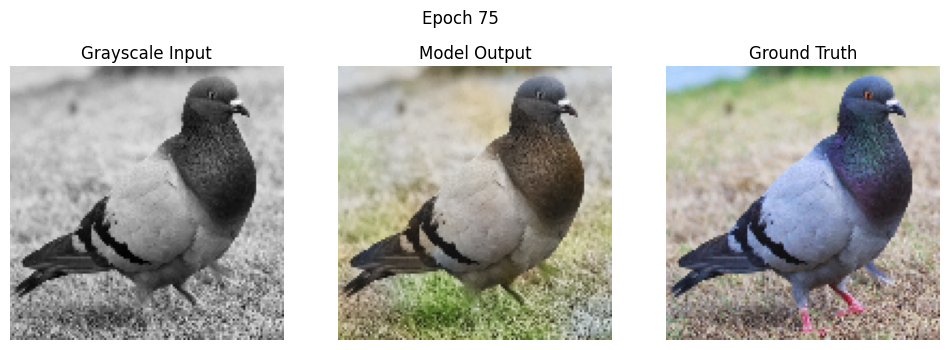

71/71 ━━━━━━━━━━━━━━━━━━━━ 4s 52ms/step - loss: 0.0077 - mse: 0.0015 - val_loss: 0.0172 - val_mse: 0.0062


In [ ]:
image_callback = ImageCallback((X_val, y_val), interval=5)

unet_history = unet_model.fit(X_train, y_train,
          validation_data=(X_val, y_val),
          epochs=75,
          batch_size=32,
          callbacks=[image_callback])

#### Visualize loss

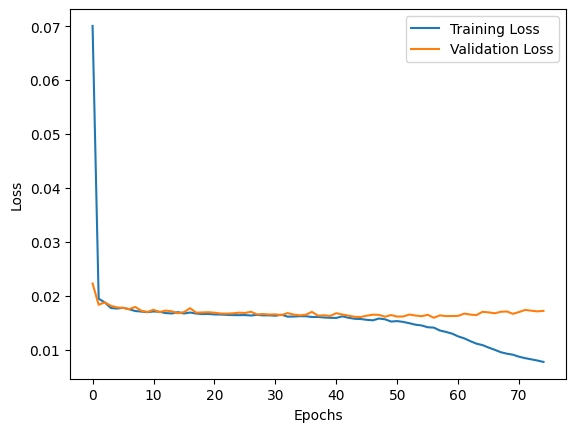

In [ ]:
plt.plot(unet_history.history['loss'], label='Training Loss')
plt.plot(unet_history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

#### Saving unet model to drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

unet_model.save('/content/drive/MyDrive/unet_model.h5')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
